# *Lipomyces starkeyi* medium optimization round 2 - part A.

This notebook leverages ART to identify conditions for testing during a second round of medium optimization. The round was split into two different ART training notebooks - parts A and parts B. This is **part A**.

Medium components have a profound impact on production of microbial products. The effects of metals and vitamins on *L. starkeyi* malic acid production has been explored in a limited capacity - with the full composition space remaining to be explored. The Automated Recommendation Tool ([ART](https://www.nature.com/articles/s41467-020-18008-4)) is a machine learning based tool for bioproduction applications. The tool has been designed to provide both initial design of experiment and recommendations for further designs. The algorithm uses [Latin Hypercube Sampling](https://en.wikipedia.org/wiki/Latin_hypercube_sampling) to combinatorally explore the initial design space. A media optimization pipeline has been described using ART ([Zournas A et al., 2024: DOI: 10.21203/rs.3.rs-5072705/v1](https://www.researchsquare.com/article/rs-5072705/v1) that is leveraged here. 


## Inputs and Outputs

**Required files to run this notebook:**
- `bounds_file.csv` - Contains the boundaries to explore.
- `standard_media_file.csv` - Contains the medium components.
- `DBTL1_Results.csv` - Round 1 results.

Clone the git repository with the `ART` library 

`git clone https://github.com/JBEI/AutomatedRecommendationTool.git`  
<!-- <font color='red'> _____ -->
<!-- **WE SHOULD TALK ABOUT LICENSING HERE!!!** </font> -->

or pull the latest version. 

Information about licensing ART is available at https://github.com/JBEI/ART.

Importing needed libraries:

In [1]:
import sys
sys.path.append('../../AutomatedRecommendationTool')        # Make sure this is the location for the ART library 
sys.path.append('../')

import re
import warnings

import matplotlib.pyplot as plt
# from art.core import designs_pairwise/
from art.core import * 
import art.plot as plot
import edd_utils as eddu

import os


WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
/usr/local/art/.venv/lib/python3.10/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


# User parameters

In [2]:
CYCLE = 2

user_params = {
    # file containing the lower and upper bounds to explore. 
    #'bounds_file': f'mediumSetup/bounds_file.csv',
    'bounds_file': f'mediumSetup/bounds_file_DBTL2.csv',

    
    
    # folder for output files.
    'output_file_path': f'mediumConcentrationOutputs/DBTL_partA{CYCLE}', 
    
    # folder containing the standard media file. 
    # for Lipomyces - this is the LPM-40-50 (lipid production medium - 40 g carbon, 50 C/N ratio).
    'standard_media_file': f'mediumSetup/standard_media_file.csv',
    
    
}

In [3]:
user_params['components'] = [
        #'glucose',
        #'xylose',
        'KH2PO4',
        'NH4Cl',
        'KCl',
        'MgSO4*7H2O',
        'ZnSO4·7H2O',
        'H3BO3',
        'MnCl2·4H2O',
        'FeSO4·7H2O',
        'CoCl2·6H2O',
        'CuSO4·5H20',
        'Na2MoO4·2H2O',
        'Na4EDTA',
        'biotin',
        'pyridoxine',
        'thiamine',
        'riboflavin',
        'para-aminobenzoic acid',
        'nicotinic acid'
]

In [4]:
user_params['response'] = 'Malate Titer (g/L)'

# Load the data

In [5]:
DBTL1_results = pd.read_csv('experimentalResults/DBTL1_results/DBTL1_Results.csv')
DBTL1_results.rename(columns={'Unnamed: 0': 'Line Name'},inplace=True)

# col_drop = np.arange(0,75) # drop all except control from dbtl 1a
# DBTL1_results.drop(col_drop,inplace=True)
DBTL1_results.tail(4)

,Line Name,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,...,Na2MoO4·2H2O,Na4EDTA,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),DCW (g/L)
152,24b,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,...,0.014513,0.791131,0.000064,0.000430,0.006342,0.046243,0.001630,0.006220,0.0,1.1
153,25b,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,13.7,11.7
154,25b,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,13.8,13.0
155,25b,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,14.0,13.0


In [6]:
# add the replicate indicator (Replicate 1 = -R1, Replicate 2 = '-R2', etc) to each line name.

DBTL1_results['Line Name'][0::3] = DBTL1_results['Line Name'][0::3].astype(str)+'-R1'
DBTL1_results['Line Name'][1::3] = DBTL1_results['Line Name'][1::3].astype(str)+'-R2'
DBTL1_results['Line Name'][2::3] = DBTL1_results['Line Name'][2::3].astype(str)+'-R3'

/tmp/ipykernel_21849/2202195188.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DBTL1_results['Line Name'][0::3] = DBTL1_results['Line Name'][0::3].astype(str)+'-R1'
/tmp/ipykernel_21849/2202195188.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DBTL1_results['Line Name'][1::3] = DBTL1_results['Line Name'][1::3].astype(str)+'-R2'
/tmp/ipykernel_21849/2202195188.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  DBTL1_results['

In [7]:
DBTL1_results.tail(6)

,Line Name,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,...,Na2MoO4·2H2O,Na4EDTA,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),DCW (g/L)
150,24b-R1,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,...,0.014513,0.791131,0.000064,0.000430,0.006342,0.046243,0.001630,0.006220,0.0,1.1
151,24b-R2,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,...,0.014513,0.791131,0.000064,0.000430,0.006342,0.046243,0.001630,0.006220,0.0,1.1
152,24b-R3,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,...,0.014513,0.791131,0.000064,0.000430,0.006342,0.046243,0.001630,0.006220,0.0,1.1
153,25b-R1,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,13.7,11.7
154,25b-R2,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,13.8,13.0
155,25b-R3,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,...,0.000084,0.005193,0.000110,0.000095,0.000092,0.000109,0.000101,0.000106,14.0,13.0


Define the controls. In DBTL 1, controls were samples 25. 

In [8]:

# control_lines = DBTL1_results[DBTL1_results['Line Name'].str.find('25')>-1]
control_lines = DBTL1_results[DBTL1_results['Line Name'].str.find('25a')>-1]
control_lines

,Line Name,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,...,Na2MoO4·2H2O,Na4EDTA,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),DCW (g/L)
75,25a-R1,1.5,1.43,0.5,0.5,0.00225,0.011,0.005,0.005,0.0017,...,0.000085,0.005,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,10.54,13.780
76,25a-R2,1.5,1.43,0.5,0.5,0.00225,0.011,0.005,0.005,0.0017,...,0.000085,0.005,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,10.92,12.940
77,25a-R3,1.5,1.43,0.5,0.5,0.00225,0.011,0.005,0.005,0.0017,...,0.000085,0.005,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,10.63,17.236


How many designs imporved the response over the standard recipe?

In [9]:
control_response = np.mean(control_lines['Malate Titer (g/L)'])
num_improved_response = np.sum(DBTL1_results['Malate Titer (g/L)'] > control_response)
num_designs = len(DBTL1_results) - len(control_lines)
print(f'{num_improved_response} samples out of {num_designs} improve over the standard in terms of Titer ({num_improved_response/num_designs*100:.2f})%')

4 samples out of 153 improve over the standard in terms of Titer (2.61)%


## Convert the data to EDD format for ART input.

Pivot the dataframe to [Experimental Data Depot format](https://edd-docs.jbei.org/), inlcuding all components names and protocols:

In [10]:
DBTL1_stacked = DBTL1_results.set_index('Line Name').stack().reset_index()
DBTL1_stacked.columns = ['Line Name', 'Measurement Type', 'Value']
DBTL1_stacked.head()

,Line Name,Measurement Type,Value
0,0a-R1,KH2PO4,3.980770
1,0a-R1,NH4Cl,2.726696
2,0a-R1,KCl,3.101909
3,0a-R1,MgSO4*7H2O,3.564820
4,0a-R1,ZnSO4·7H2O,0.342065


# Media designs recommendations

## ART Parameter setup.

Define a dictionary that contains the settings ART will use to find the recommended designs:


In [11]:
art_params = {
    'input_vars': user_params['components'],
    'response_vars': [user_params['response']],
    'bounds_file': user_params['bounds_file'], # file with bounds for input variables (i.e., features)
    'seed': 12,
    'cross_val': True,
    'recommend': False,
    'output_directory': user_params['output_file_path'],
    'verbose': 0,
    'max_mcmc_cores':4
}

We will first run only the model initialization and then proceed with optimization using the two modes - exploration and explotation.

In [12]:
user_params['alpha_explor'] = 1.0
user_params['alpha_exploit'] = None


Here we specify how many instances (design) we want to create and how many replicates:


In [13]:
user_params['n_instances_explore'] = 12
user_params['n_instances_exploit'] = 13
user_params['n_replicates'] = 3

with the configuration now stored in art_params, we now run ART:

## Initialize and Train ART

In [14]:
run_art = True

Dataframe does not have a time column matching one of the supported formats. Assuming that all data in the file comes from a single time point.
Version 0.11.7 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [omegas, sigma]
Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 19 seconds.
The number of effective samples is smaller than 25% for some parameters.
Version 0.11.7 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [omegas, sigma]
Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 17 seconds.
The number of effective samples is smaller than 25% for some parameters.
Version 0.11.7 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [omegas, sigma]
Sampling 4 chains for 1_000 tune 

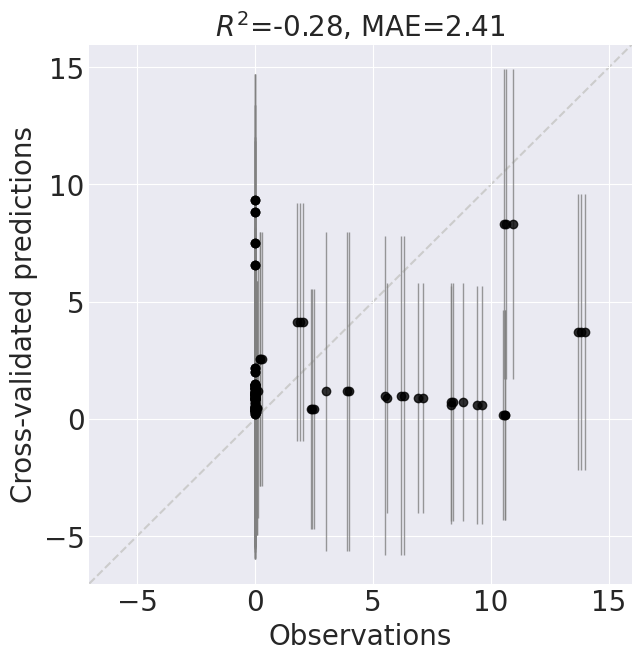

Version 0.11.7 of tpot is outdated. Version 0.12.2 was released Friday February 23, 2024.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [omegas, sigma]
Sampling 4 chains for 1_000 tune and 10_000 draw iterations (4_000 + 40_000 draws total) took 20 seconds.
The number of effective samples is smaller than 25% for some parameters.


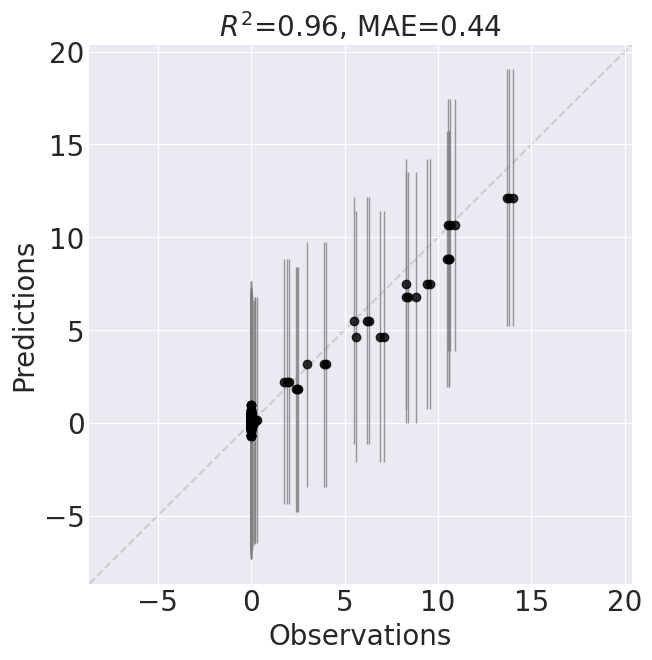

CPU times: user 8min 53s, sys: 7.37 s, total: 9min 1s
Wall time: 12min 6s


In [15]:
%%time
warnings.filterwarnings("ignore")
if run_art:
    art = RecommendationEngine(DBTL1_stacked, **art_params)
else:
    with open(os.path.join(art_params['output_directory'], 'art.pkl'), 'rb') as output:
        art = pickle.load(output)

In [16]:
art.evaluate_models_cv()

,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,2.378217,inf,2.740926,13.168590,-0.199207
Random Forest Regressor,2.262532,NaN,2.387364,10.818561,0.014800
Support Vector Regressor,1.748667,inf,2.828934,11.060705,-0.007251
Kernel Ridge Regressor,1.548697,inf,2.295815,7.669229,0.301596
K-NN Regressor,1.818910,NaN,2.926574,11.873271,-0.081248
Gaussian Process Regressor,2.145625,inf,2.038744,8.760186,0.202247
Gradient Boosting Regressor,2.313020,inf,2.593937,12.078569,-0.099944
TPOT Regressor,2.363925,NaN,3.549566,18.187560,-0.656263
Ensemble Model,2.411784,inf,2.876847,14.092951,-0.283385


## Exploitation recommendations

In [17]:
%%time
art.niter = 100000
art.alpha = user_params['alpha_exploit']
draws = art.parallel_tempering_opt()

CPU times: user 183 ms, sys: 21.3 ms, total: 204 ms
Wall time: 3min 26s


In [18]:
orig_file_name = f"{art_params['output_directory']}/draws.txt"
new_file_name = f"{art_params['output_directory']}/draws_exploit.txt"
os.rename(orig_file_name, new_file_name)

In [19]:
art.num_recommendations = user_params['n_instances_exploit'] # # instances exploiting in DBTL2
art.rel_rec_distance = 2.0 # Default is 0.2

# At least one of the features in the recommendation must differ by this relative factor from any point in the training data and any previous recommendations
# Then pick the one with the best objective function value and add to the recommendations. Repeat the distance filtering above. 
# Stops when 7 recommendations are found.

# If it cannot find enough recommendations, it will decrease the distance by 0.80x and try again.
art.recommend(draws)

In [20]:
df_rec_exploit = art.recommendations.copy()

Add standard deviation for the predictions:

In [21]:
predicted_mean, predicted_std = art.post_pred_stats(
            df_rec_exploit.values[:, :-1]
        ) # posterior predictive statistics: mean and std

df_rec_exploit['Malate Titer (g/L) mean'] = predicted_mean
df_rec_exploit['Malate Titer (g/L) std'] = predicted_std

df_rec_exploit['Label'] = 'exploitation' # will be used for plotting in the parity plot in notebook F


In [22]:
df_rec_exploit

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,0.981182,0.549615,0.676200,0.177079,0.388182,0.128970,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.008710,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
1,0.518042,0.806969,0.178590,0.424602,0.261296,0.072584,0.216698,0.252091,0.172690,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
2,0.466430,0.849415,0.486112,0.119164,0.014898,0.019114,0.225068,0.200112,0.418477,0.376180,...,0.002714,0.009354,0.008111,0.048078,0.009131,0.002625,5.240039,5.240039,3.667654,exploitation
3,0.507073,0.800181,0.493373,0.142669,0.120934,0.002034,0.239579,0.207444,0.481032,0.343206,...,0.002819,0.009558,0.008055,0.050673,0.008973,0.002520,5.201287,5.201287,3.653692,exploitation
4,1.109196,0.537736,0.756556,0.510874,0.194439,0.456096,0.361436,0.081867,0.001730,0.488256,...,0.006494,0.002124,0.008159,0.017925,0.004117,0.009880,5.196012,5.196012,3.595080,exploitation
5,0.340742,0.683087,0.223283,0.351671,0.076285,0.437686,0.233815,0.444259,0.233697,0.258600,...,0.005303,0.007570,0.009452,0.052419,0.005867,0.008509,5.168677,5.168677,3.665496,exploitation
6,1.280994,0.893789,0.407592,0.172920,0.177392,0.154117,0.347472,0.390939,0.302731,0.149729,...,0.008290,0.001089,0.000599,0.054915,0.008461,0.009090,5.161684,5.161684,3.615684,exploitation
7,0.623501,0.739260,0.840093,0.634192,0.206702,0.424604,0.497080,0.198497,0.436397,0.069253,...,0.005244,0.007031,0.005688,0.045106,0.007013,0.005510,5.156786,5.156786,3.599856,exploitation
8,0.876407,1.288441,0.081142,0.358968,0.088408,0.306839,0.292230,0.448233,0.179697,0.140516,...,0.004839,0.007037,0.009564,0.042888,0.006543,0.008364,5.155459,5.155459,3.634343,exploitation
9,0.414720,1.400928,0.370045,0.796451,0.341498,0.180671,0.463741,0.104885,0.266052,0.169317,...,0.002281,0.001375,0.007121,0.041629,0.006762,0.008878,5.136493,5.136493,3.561223,exploitation


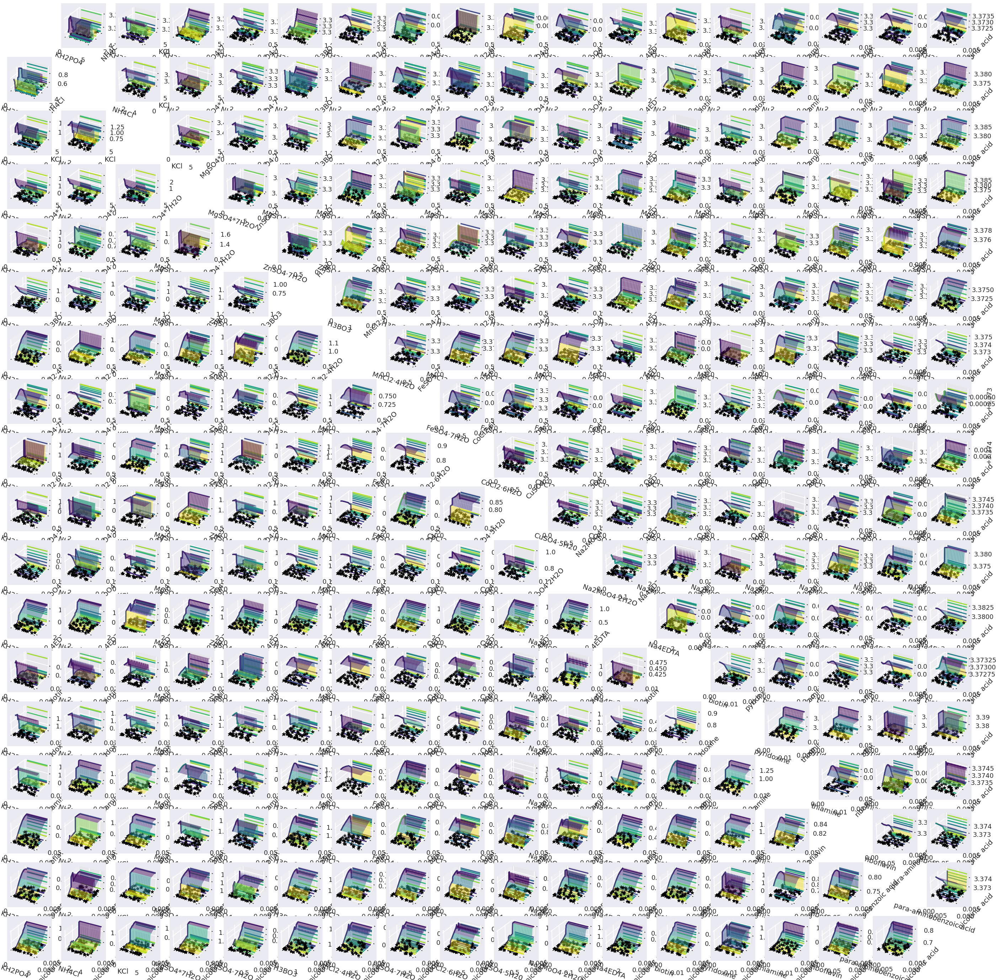


KeyboardInterrupt



In [23]:
# plot.model_pairwise(art)

In [24]:
def designs_pairwise(art, df):

    dim = art.num_input_var

    plt.style.use(["seaborn-talk"])

    fig = plt.figure(figsize=(50, 50))
    fig.patch.set_facecolor("white")

    X = df.values

    for var1 in range(dim):
        for var2 in range(var1 + 1, dim):

            ax = fig.add_subplot(dim, dim, (var2 * dim + var1 + 1))
            ax.scatter(
                X[:, var1],
                X[:, var2],
                c="r",
                edgecolor="r",
                marker="+",
                lw=1,
                label="Train data",
            )
            # print(var1)
            # print(var2)
            # ax.scatter(
            #     standard[var1],
            #     standard[var2],
            #     c="k",
            #     marker=".",
            #     s=126,
            #     lw=1,
            #     label="Standard",
            # )
            
            if var2 == (dim - 1):
                ax.set_xlabel(art.input_vars[var1])
            if var1 == 0:
                ax.set_ylabel(art.input_vars[var2])
                if var2 == 0:
                    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), shadow=True)

    fig.savefig(f'{art.outDir}/l.png', transparent=False, dpi=300)

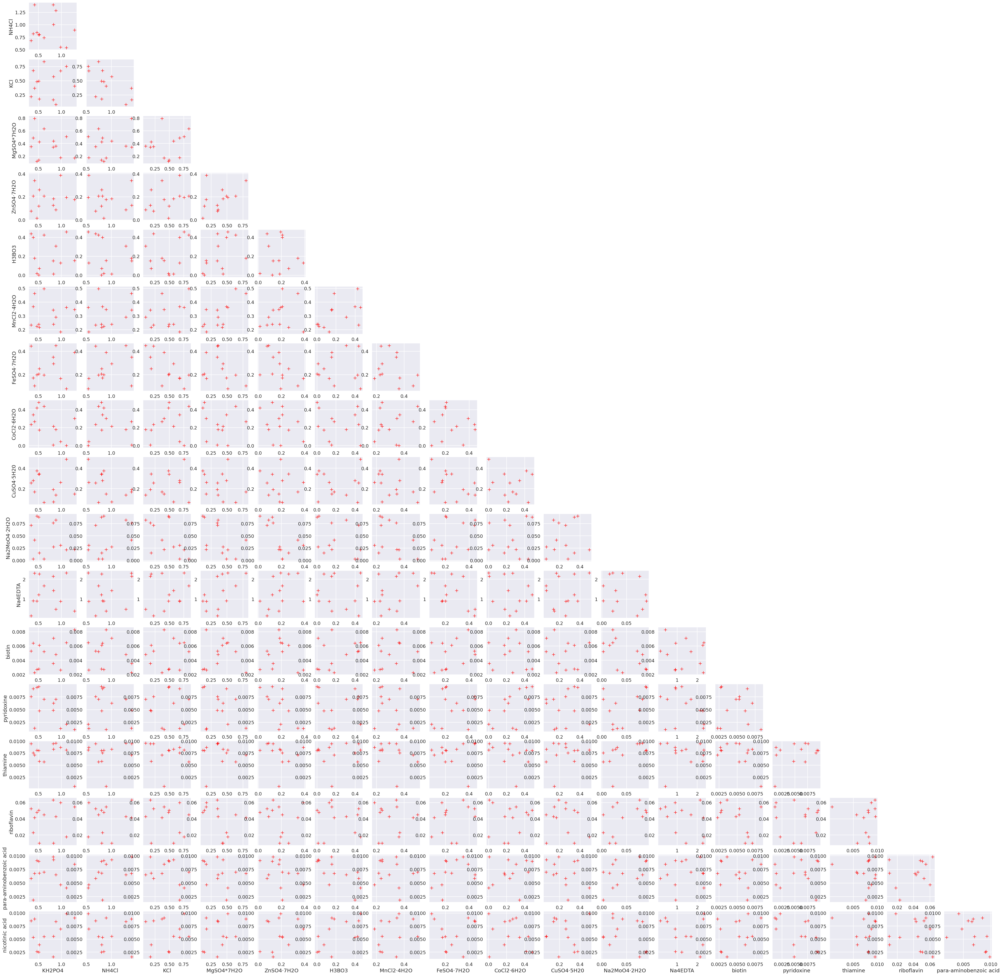

In [25]:
## visualize.
designs_pairwise(art, df_rec_exploit)

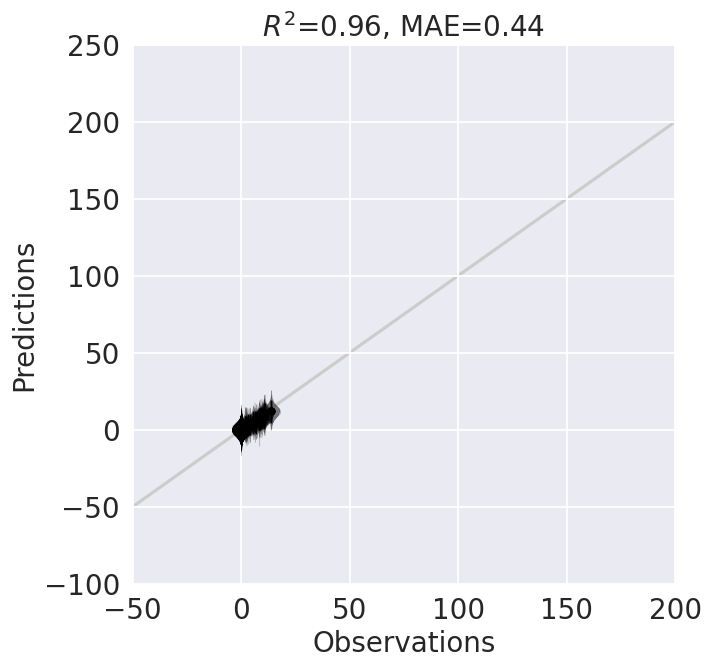

In [26]:
plot.predictions_distr_vs_observations(art, cv_flag=False, widths=8,
                                       xlim=[[-50, 200]], ylim=[[-100, 250]])

## Exploration recommendations

In [27]:
%%time
art.niter = 100000
art.alpha = user_params['alpha_explor']
draws = art.parallel_tempering_opt()



CPU times: user 156 ms, sys: 21.3 ms, total: 177 ms
Wall time: 3min 31s


In [28]:
orig_file_name = f"{art_params['output_directory']}/draws.txt"
new_file_name = f"{art_params['output_directory']}/draws_explor.txt"
os.rename(orig_file_name, new_file_name)



In [29]:
art.num_recommendations = user_params['n_instances_explore']
art.rel_rec_distance = 3.0
art.recommend(draws)


# At least one of the features in the recommendation must differ by this relative factor from any point in the training data and any previous recommendations
# Then pick the one with the best objective function value and add to the recommendations. Repeat the distance filtering above. 
# Stops when 7 recommendations are found.

# If it cannot find enough recommendations, it will decrease the distance by 0.80x and try again.

In [30]:
df_rec_explor = art.recommendations.copy()

In [31]:
df_rec_explor

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,Na2MoO4·2H2O,Na4EDTA,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L)
0,1.148172,1.232022,0.208146,0.109126,0.066105,0.192875,0.451324,0.316272,0.393510,0.463925,0.004724,1.205601,0.000845,0.007926,0.002269,0.038080,0.005159,0.006412,5.000897
1,1.012616,0.930754,0.577268,0.130166,0.133263,0.082647,0.105936,0.056915,0.275617,0.290375,0.098209,1.836313,0.006815,0.009945,0.004088,0.022677,0.006691,0.006652,4.670235
2,0.259860,0.714448,0.492148,1.033702,0.332134,0.696954,0.371915,0.368242,0.248870,0.475147,0.000689,0.716393,0.004752,0.004234,0.005032,0.021115,0.005867,0.007936,4.526777
3,0.612432,0.594899,0.551256,0.625232,0.213923,0.498295,0.042028,0.037699,0.290792,0.251041,0.003321,2.345186,0.006549,0.005647,0.002114,0.052320,0.001279,0.005933,4.211509
4,0.365653,1.165745,1.199669,0.098475,0.341295,0.604019,0.161905,0.126051,0.200974,0.375641,0.069202,2.480244,0.008165,0.003244,0.009851,0.033559,0.002401,0.002397,4.154743
5,0.268423,0.898958,0.614203,1.066096,0.157318,0.760497,0.077976,0.418545,0.083855,0.335166,0.081746,1.680463,0.003131,0.000975,0.008545,0.006520,0.008070,0.007457,4.123217
6,1.662829,1.154133,0.057864,0.301456,0.068722,0.187281,0.415901,0.368652,0.429362,0.397473,0.035172,2.186187,0.001154,0.009301,0.000881,0.046587,0.005000,0.006404,4.369796
7,0.757601,0.988030,0.775033,0.543971,0.267118,0.493025,0.180297,0.053866,0.171896,0.418056,0.062712,1.901380,0.001850,0.002604,0.002606,0.034162,0.000623,0.007440,4.030470
8,0.660968,1.281550,1.016175,0.594974,0.303840,0.879478,0.238852,0.372489,0.370764,0.409459,0.027574,0.569723,0.003447,0.008659,0.006141,0.036765,0.007184,0.009047,3.991501
9,1.142525,1.509427,0.223432,0.852777,0.135689,0.227811,0.385486,0.311920,0.247852,0.476709,0.030233,2.425033,0.003236,0.000858,0.006837,0.024736,0.005358,0.000408,4.197176


In [32]:
predicted_mean, predicted_std = art.post_pred_stats(
            df_rec_explor.values[:, :-1]
        )
df_rec_explor['Malate Titer (g/L) mean'] = predicted_mean
df_rec_explor['Malate Titer (g/L) std'] = predicted_std

df_rec_explor['Label'] = 'exploration'

In [33]:
df_rec_explor

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,1.148172,1.232022,0.208146,0.109126,0.066105,0.192875,0.451324,0.316272,0.393510,0.463925,...,0.000845,0.007926,0.002269,0.038080,0.005159,0.006412,5.000897,5.000897,3.604149,exploration
1,1.012616,0.930754,0.577268,0.130166,0.133263,0.082647,0.105936,0.056915,0.275617,0.290375,...,0.006815,0.009945,0.004088,0.022677,0.006691,0.006652,4.670235,4.670235,3.578050,exploration
2,0.259860,0.714448,0.492148,1.033702,0.332134,0.696954,0.371915,0.368242,0.248870,0.475147,...,0.004752,0.004234,0.005032,0.021115,0.005867,0.007936,4.526777,4.526777,3.558416,exploration
3,0.612432,0.594899,0.551256,0.625232,0.213923,0.498295,0.042028,0.037699,0.290792,0.251041,...,0.006549,0.005647,0.002114,0.052320,0.001279,0.005933,4.211509,4.211509,3.550319,exploration
4,0.365653,1.165745,1.199669,0.098475,0.341295,0.604019,0.161905,0.126051,0.200974,0.375641,...,0.008165,0.003244,0.009851,0.033559,0.002401,0.002397,4.154743,4.154743,3.549884,exploration
5,0.268423,0.898958,0.614203,1.066096,0.157318,0.760497,0.077976,0.418545,0.083855,0.335166,...,0.003131,0.000975,0.008545,0.006520,0.008070,0.007457,4.123217,4.123217,3.547937,exploration
6,1.662829,1.154133,0.057864,0.301456,0.068722,0.187281,0.415901,0.368652,0.429362,0.397473,...,0.001154,0.009301,0.000881,0.046587,0.005000,0.006404,4.369796,4.369796,3.536781,exploration
7,0.757601,0.988030,0.775033,0.543971,0.267118,0.493025,0.180297,0.053866,0.171896,0.418056,...,0.001850,0.002604,0.002606,0.034162,0.000623,0.007440,4.030470,4.030470,3.529724,exploration
8,0.660968,1.281550,1.016175,0.594974,0.303840,0.879478,0.238852,0.372489,0.370764,0.409459,...,0.003447,0.008659,0.006141,0.036765,0.007184,0.009047,3.991501,3.991501,3.518918,exploration
9,1.142525,1.509427,0.223432,0.852777,0.135689,0.227811,0.385486,0.311920,0.247852,0.476709,...,0.003236,0.000858,0.006837,0.024736,0.005358,0.000408,4.197176,4.197176,3.499777,exploration


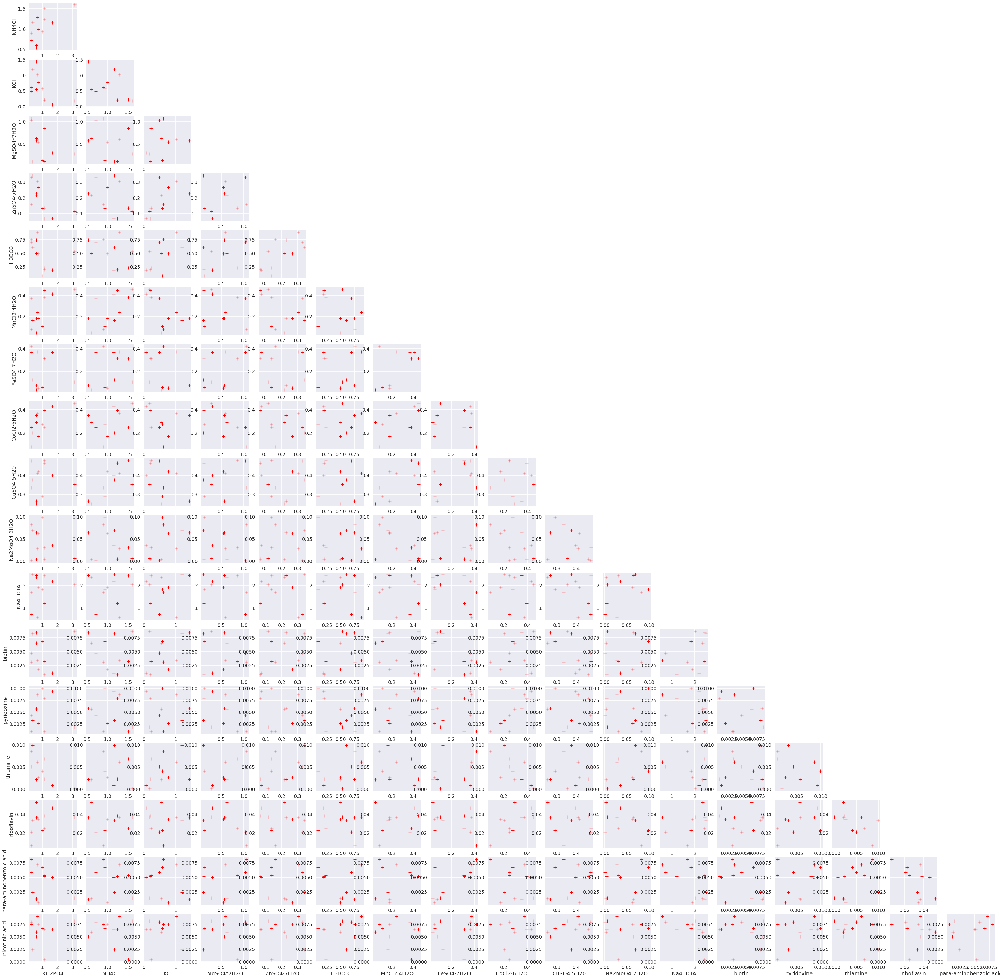

In [34]:
designs_pairwise(art, df_rec_explor)

# Combine exploit and explore recommendations together for experiment.

In [35]:
df_rec = df_rec_exploit.append(df_rec_explor)

In [36]:
# df_rec = df_rec.rename(columns={"Malate titer (g/L)": "Malate titer (g/L) prediction"})

## Generate the control media

Read the standard recipe:

In [37]:
df_stand = pd.read_csv(user_params['standard_media_file']).set_index("Ingrediant")



Control media will be uniformly drawn from the interval 
90% to 110% around the standard recipe.


In [38]:


ub = 1.1
lb = 0.9
df_control = pd.DataFrame(columns=user_params['components'])

for component in user_params['components']:
    stand_conc = df_stand.loc[component]['Standard concentration (LPM-40-50)']
    df_control.at['Control', component] = stand_conc*np.random.uniform(lb, ub)

df_control



,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,Na2MoO4·2H2O,Na4EDTA,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid
Control,1.640931,1.534628,0.542653,0.512309,0.002218,0.011664,0.005432,0.004895,0.001849,0.001691,0.000087,0.005051,0.000094,0.000103,0.000095,0.000104,0.000103,0.000095




Check that these controls are not equivalent to the controls tested in previous cycles:


In [39]:
for component in user_params['components']:
     assert(all(df_control.at['Control', component] != control_lines[component]))



Add ART's prediction for this design


In [40]:


control_predicted_mean, control_predicted_std = art.post_pred_stats(
            df_control.values
        )


df_control['Malate Titer (g/L) mean'] = control_predicted_mean
df_control['Malate Titer (g/L) std'] = control_predicted_std
df_control['Label'] = 'standard'



In [41]:
df_rec = df_rec.append(df_control).reset_index(drop=True)
df_rec

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
2,0.46643,0.849415,0.486112,0.119164,0.014898,0.019114,0.225068,0.200112,0.418477,0.37618,...,0.002714,0.009354,0.008111,0.048078,0.009131,0.002625,5.240039,5.240039,3.667654,exploitation
3,0.507073,0.800181,0.493373,0.142669,0.120934,0.002034,0.239579,0.207444,0.481032,0.343206,...,0.002819,0.009558,0.008055,0.050673,0.008973,0.00252,5.201287,5.201287,3.653692,exploitation
4,1.109196,0.537736,0.756556,0.510874,0.194439,0.456096,0.361436,0.081867,0.00173,0.488256,...,0.006494,0.002124,0.008159,0.017925,0.004117,0.00988,5.196012,5.196012,3.595080,exploitation
5,0.340742,0.683087,0.223283,0.351671,0.076285,0.437686,0.233815,0.444259,0.233697,0.2586,...,0.005303,0.00757,0.009452,0.052419,0.005867,0.008509,5.168677,5.168677,3.665496,exploitation
6,1.280994,0.893789,0.407592,0.17292,0.177392,0.154117,0.347472,0.390939,0.302731,0.149729,...,0.00829,0.001089,0.000599,0.054915,0.008461,0.00909,5.161684,5.161684,3.615684,exploitation
7,0.623501,0.73926,0.840093,0.634192,0.206702,0.424604,0.49708,0.198497,0.436397,0.069253,...,0.005244,0.007031,0.005688,0.045106,0.007013,0.00551,5.156786,5.156786,3.599856,exploitation
8,0.876407,1.288441,0.081142,0.358968,0.088408,0.306839,0.29223,0.448233,0.179697,0.140516,...,0.004839,0.007037,0.009564,0.042888,0.006543,0.008364,5.155459,5.155459,3.634343,exploitation
9,0.41472,1.400928,0.370045,0.796451,0.341498,0.180671,0.463741,0.104885,0.266052,0.169317,...,0.002281,0.001375,0.007121,0.041629,0.006762,0.008878,5.136493,5.136493,3.561223,exploitation



## Check the distribution of designs

Define dataframe with train data and predictions:


In [42]:
df_train = DBTL1_results[user_params['components']]
df_train['Malate Titer (g/L)'] = DBTL1_results['Malate Titer (g/L)']



Add predictions, cv-predictions and standard deviation of the OD340 predictions:


In [43]:
train_predicted_mean, train_predicted_std = art.post_pred_stats(
            df_train.values[:, :-1]
        )


In [44]:
df_train['Malate_pred'] = train_predicted_mean
df_train['Malate_std'] = train_predicted_std
df_train['Malate_cv_pred'] = art.model_df_cv[0]["Predictions"]["Ensemble Model"]
df_train['Malate_cv_std'] = art.model_df_cv[0]["Predictions StDev"]["Ensemble Model"]

Add label for control lines:

In [45]:


df_train['Label'] = 'train'
df_train.loc[control_lines.index, 'Label'] = 'standard'



In [46]:
df_train

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate_pred,Malate_std,Malate_cv_pred,Malate_cv_std,Label
0,3.980770,2.726696,3.101909,3.564820,0.342065,0.266442,0.266025,0.148381,0.168819,0.217547,...,0.003923,0.029026,0.004538,0.002338,2.38,1.808731,3.372651,0.407984,2.610409,train
1,3.980770,2.726696,3.101909,3.564820,0.342065,0.266442,0.266025,0.148381,0.168819,0.217547,...,0.003923,0.029026,0.004538,0.002338,2.43,1.808731,3.372651,0.407984,2.610409,train
2,3.980770,2.726696,3.101909,3.564820,0.342065,0.266442,0.266025,0.148381,0.168819,0.217547,...,0.003923,0.029026,0.004538,0.002338,2.49,1.808731,3.372651,0.407984,2.610409,train
3,0.463416,1.202824,3.487949,2.090830,0.002133,0.641487,0.364212,0.470553,0.419028,0.001260,...,0.003438,0.000026,0.007167,0.007175,0.07,0.282898,3.367697,1.016497,3.217431,train
4,0.463416,1.202824,3.487949,2.090830,0.002133,0.641487,0.364212,0.470553,0.419028,0.001260,...,0.003438,0.000026,0.007167,0.007175,0.07,0.282898,3.367697,1.016497,3.217431,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,0.365132,...,0.006342,0.046243,0.001630,0.006220,0.00,0.428330,3.370450,0.357492,2.289320,train
152,3.428819,1.341367,3.781297,1.407678,0.044357,0.399550,0.392034,0.434811,0.417774,0.365132,...,0.006342,0.046243,0.001630,0.006220,0.00,0.428330,3.370450,0.357492,2.289320,train
153,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,0.001630,...,0.000092,0.000109,0.000101,0.000106,13.70,12.129876,3.534526,0.789437,2.513300,train
154,1.457624,1.308322,0.473938,0.538452,0.002377,0.011335,0.005347,0.005444,0.001841,0.001630,...,0.000092,0.000109,0.000101,0.000106,13.80,12.129876,3.534526,0.789437,2.513300,train


save the control data set for this cycle:

In [47]:


file = f"{user_params['output_file_path']}/train_pred.csv"
df_train.to_csv(file)



In [48]:
def designs_pairwise(art, df_rec, user_params, df_train=None):

    dim = art.num_input_var

    plt.style.use('seaborn-whitegrid')

    fig = plt.figure(figsize=(35, 35))
    fig.patch.set_facecolor("white")

    X = df_rec[user_params['components']].values
    X_train = df_train[user_params['components']].values
    standard = df_train[df_train['Label']=='standard'].drop(columns='Label').values

    for var1 in range(dim):
        for var2 in range(var1 + 1, dim):

            ax = fig.add_subplot(dim, dim, (var2 * dim + var1 + 1))
            ax.scatter(
                X_train[:, var1],
                X_train[:, var2],
                c="r",
                marker=".",
                s=150*df_train['Malate Titer (g/L)'],
                lw=1,
                label="Train data",
            )
            
            ax.scatter(
                standard[:, var1],
                standard[:, var2],
                c="k",
                marker=".",
                s=150*standard[:, -1].astype(float),
                lw=1,
                label="Standard",
            )
            
            ax.scatter(
                X[:, var1],
                X[:, var2],
                c="g",
                marker=".",
                s=150*df_rec['Malate Titer (g/L) mean'],
                lw=1,
                label="Recommendations",
            )
            
            ax.scatter(
                X[-1, var1],
                X[-1, var2],
                c="k",
                marker=".",
                s=150*df_rec['Malate Titer (g/L) mean'].values[-1],
                lw=1,
                label="Standard",
            )
            
            
                        
            if var2 == (dim - 1):
                ax.set_xlabel(art.input_vars[var1])
            if var1 == 0:
                ax.set_ylabel(art.input_vars[var2])
                if var2 == 0:
                    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), shadow=True)

    fig.savefig(
        f'{art.outDir}/designs_pairwise_26.png',
        bbox_inches="tight",
        transparent=False, 
        dpi=300
    )

In [49]:
df_rec

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
2,0.46643,0.849415,0.486112,0.119164,0.014898,0.019114,0.225068,0.200112,0.418477,0.37618,...,0.002714,0.009354,0.008111,0.048078,0.009131,0.002625,5.240039,5.240039,3.667654,exploitation
3,0.507073,0.800181,0.493373,0.142669,0.120934,0.002034,0.239579,0.207444,0.481032,0.343206,...,0.002819,0.009558,0.008055,0.050673,0.008973,0.00252,5.201287,5.201287,3.653692,exploitation
4,1.109196,0.537736,0.756556,0.510874,0.194439,0.456096,0.361436,0.081867,0.00173,0.488256,...,0.006494,0.002124,0.008159,0.017925,0.004117,0.00988,5.196012,5.196012,3.595080,exploitation
5,0.340742,0.683087,0.223283,0.351671,0.076285,0.437686,0.233815,0.444259,0.233697,0.2586,...,0.005303,0.00757,0.009452,0.052419,0.005867,0.008509,5.168677,5.168677,3.665496,exploitation
6,1.280994,0.893789,0.407592,0.17292,0.177392,0.154117,0.347472,0.390939,0.302731,0.149729,...,0.00829,0.001089,0.000599,0.054915,0.008461,0.00909,5.161684,5.161684,3.615684,exploitation
7,0.623501,0.73926,0.840093,0.634192,0.206702,0.424604,0.49708,0.198497,0.436397,0.069253,...,0.005244,0.007031,0.005688,0.045106,0.007013,0.00551,5.156786,5.156786,3.599856,exploitation
8,0.876407,1.288441,0.081142,0.358968,0.088408,0.306839,0.29223,0.448233,0.179697,0.140516,...,0.004839,0.007037,0.009564,0.042888,0.006543,0.008364,5.155459,5.155459,3.634343,exploitation
9,0.41472,1.400928,0.370045,0.796451,0.341498,0.180671,0.463741,0.104885,0.266052,0.169317,...,0.002281,0.001375,0.007121,0.041629,0.006762,0.008878,5.136493,5.136493,3.561223,exploitation




Red are train data, green are recommendations, black are standards


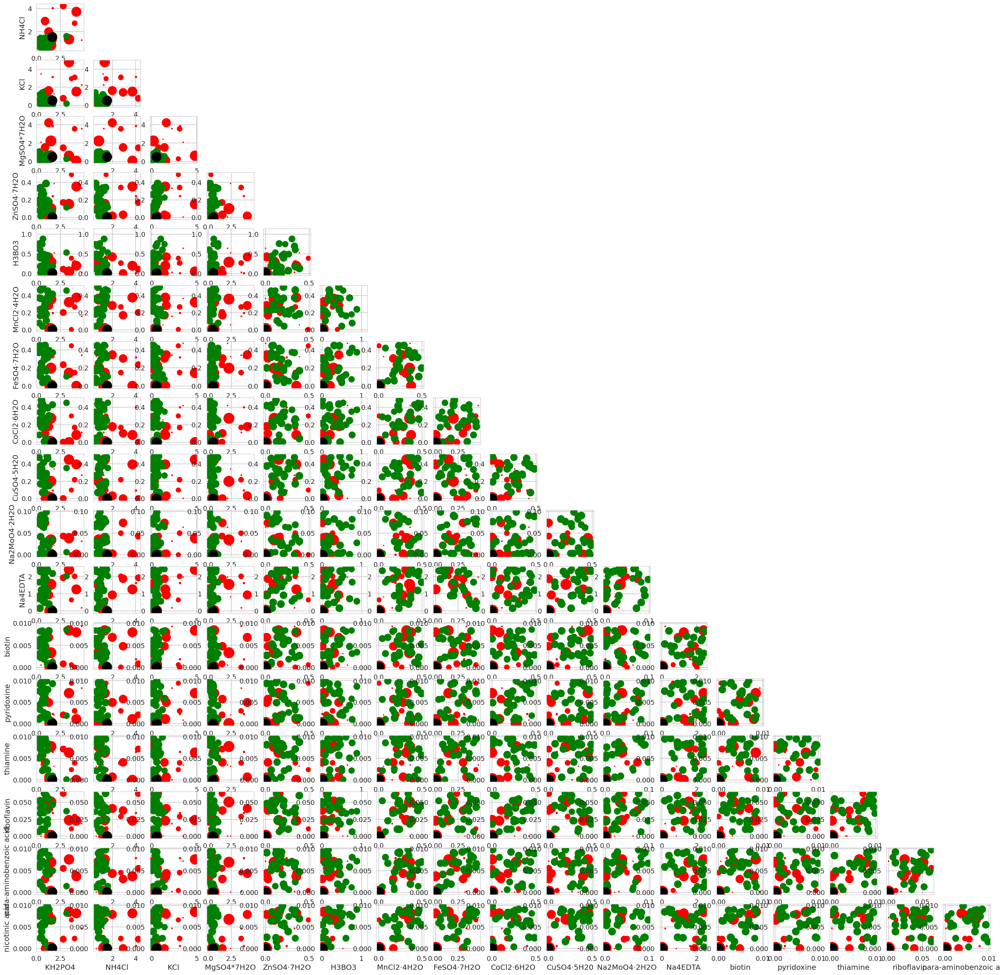

In [50]:
designs_pairwise(art, df_rec, user_params, df_train)

In [51]:
df_rec

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
2,0.46643,0.849415,0.486112,0.119164,0.014898,0.019114,0.225068,0.200112,0.418477,0.37618,...,0.002714,0.009354,0.008111,0.048078,0.009131,0.002625,5.240039,5.240039,3.667654,exploitation
3,0.507073,0.800181,0.493373,0.142669,0.120934,0.002034,0.239579,0.207444,0.481032,0.343206,...,0.002819,0.009558,0.008055,0.050673,0.008973,0.00252,5.201287,5.201287,3.653692,exploitation
4,1.109196,0.537736,0.756556,0.510874,0.194439,0.456096,0.361436,0.081867,0.00173,0.488256,...,0.006494,0.002124,0.008159,0.017925,0.004117,0.00988,5.196012,5.196012,3.595080,exploitation
5,0.340742,0.683087,0.223283,0.351671,0.076285,0.437686,0.233815,0.444259,0.233697,0.2586,...,0.005303,0.00757,0.009452,0.052419,0.005867,0.008509,5.168677,5.168677,3.665496,exploitation
6,1.280994,0.893789,0.407592,0.17292,0.177392,0.154117,0.347472,0.390939,0.302731,0.149729,...,0.00829,0.001089,0.000599,0.054915,0.008461,0.00909,5.161684,5.161684,3.615684,exploitation
7,0.623501,0.73926,0.840093,0.634192,0.206702,0.424604,0.49708,0.198497,0.436397,0.069253,...,0.005244,0.007031,0.005688,0.045106,0.007013,0.00551,5.156786,5.156786,3.599856,exploitation
8,0.876407,1.288441,0.081142,0.358968,0.088408,0.306839,0.29223,0.448233,0.179697,0.140516,...,0.004839,0.007037,0.009564,0.042888,0.006543,0.008364,5.155459,5.155459,3.634343,exploitation
9,0.41472,1.400928,0.370045,0.796451,0.341498,0.180671,0.463741,0.104885,0.266052,0.169317,...,0.002281,0.001375,0.007121,0.041629,0.006762,0.008878,5.136493,5.136493,3.561223,exploitation



## Saving the generated designs

include all replicates:

In [52]:
df_rec_wells = df_rec.loc[df_rec.index.repeat(3)]

In [53]:
df_rec_wells

,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
0,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24,3.130198,1.595803,0.183082,0.279352,0.113216,0.533102,0.457111,0.10583,0.450758,0.352594,...,0.008576,0.001857,0.000079,0.03696,0.001436,0.008157,3.646560,3.646560,3.481502,exploration
24,3.130198,1.595803,0.183082,0.279352,0.113216,0.533102,0.457111,0.10583,0.450758,0.352594,...,0.008576,0.001857,0.000079,0.03696,0.001436,0.008157,3.646560,3.646560,3.481502,exploration
25,1.640931,1.534628,0.542653,0.512309,0.002218,0.011664,0.005432,0.004895,0.001849,0.001691,...,0.000094,0.000103,0.000095,0.000104,0.000103,0.000095,NaN,8.637802,3.566690,standard
25,1.640931,1.534628,0.542653,0.512309,0.002218,0.011664,0.005432,0.004895,0.001849,0.001691,...,0.000094,0.000103,0.000095,0.000104,0.000103,0.000095,NaN,8.637802,3.566690,standard




Rename index to well names:


In [54]:
well_rows = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
well_columns = '123'


In [55]:
well_names = [f'{row}{column}'  for row in well_rows for column in well_columns ]

df_rec_wells['Well'] = well_names
df_rec_wells = df_rec_wells.set_index(['Well'])
df_rec_wells


,KH2PO4,NH4Cl,KCl,MgSO4*7H2O,ZnSO4·7H2O,H3BO3,MnCl2·4H2O,FeSO4·7H2O,CoCl2·6H2O,CuSO4·5H20,...,biotin,pyridoxine,thiamine,riboflavin,para-aminobenzoic acid,nicotinic acid,Malate Titer (g/L),Malate Titer (g/L) mean,Malate Titer (g/L) std,Label
Well,,,,,,,,,,,,,,,,,,,,,
A1,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
A2,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
A3,0.981182,0.549615,0.6762,0.177079,0.388182,0.12897,0.184851,0.168744,0.043779,0.262562,...,0.002658,0.001318,0.00871,0.060054,0.004712,0.006945,5.290751,5.290751,3.634954,exploitation
B1,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
B2,0.518042,0.806969,0.17859,0.424602,0.261296,0.072584,0.216698,0.252091,0.17269,0.343906,...,0.006114,0.004776,0.005817,0.010199,0.006815,0.003955,5.243542,5.243542,3.611104,exploitation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Y2,3.130198,1.595803,0.183082,0.279352,0.113216,0.533102,0.457111,0.10583,0.450758,0.352594,...,0.008576,0.001857,0.000079,0.03696,0.001436,0.008157,3.646560,3.646560,3.481502,exploration
Y3,3.130198,1.595803,0.183082,0.279352,0.113216,0.533102,0.457111,0.10583,0.450758,0.352594,...,0.008576,0.001857,0.000079,0.03696,0.001436,0.008157,3.646560,3.646560,3.481502,exploration
Z1,1.640931,1.534628,0.542653,0.512309,0.002218,0.011664,0.005432,0.004895,0.001849,0.001691,...,0.000094,0.000103,0.000095,0.000104,0.000103,0.000095,NaN,8.637802,3.566690,standard


In [56]:
file = f"{user_params['output_file_path']}/target_concentrations_26.csv"
df_rec.to_csv(file) 
file = f"{user_params['output_file_path']}/target_concentrations_wells_26.csv"

df_rec_wells.to_csv(file)
